# Tutorial1: 10X Visium dataset (DLPFC)

Here, we use sample id 151673 from DLPFC dataset  to demostrate the performance of GraphPCA. can be downloaded from their original study spatialLIBD(https://research.libd.org/spatialLIBD/index.html).  

## Load packages

In [4]:
import GraphPCA as sg
import scanpy as sc
import anndata as ad
import numpy as np
import pandas as pd
import squidpy as sq

In [ ]:
from sklearn.metrics import adjusted_rand_score as ari_score
from sklearn.cluster import KMeans

In [ ]:

samples = ["151507", "151508", "151509", "151510", "151669", "151670",
           "151671", "151672", "151673", "151674", "151675", "151676"]
BestK=[7,7,7,7,5,5,5,5,7,7,7,7]
data_path = "../../data/DLPFC/"
save_path = "../../results/DLPFC/"
path_GT = "../../data/DLPFC/groundtruth/SpatialDE_clustering/cluster_labels_"
sample_id = 8
PCA_components = 50

In [ ]:
adata = sc.read(data_path + samples[sample_id] + "/sample_data.h5ad")
sc.pp.filter_genes(adata,min_cells=20)
sc.experimental.pp.normalize_pearson_residuals(adata)
sc.pp.scale(adata)
SVG_list = pd.read_csv("../../results/DLPFC/SpatialPCA_data_preprocess/" + samples[sample_id] + "_SVGs.csv",index_col=0)
adata = adata[:,adata.var.gene_ids.isin(SVG_list.x)]    

groundtruth=pd.read_csv(path_GT+samples[sample_id]+".csv", sep=",",header=0,na_filter=False,index_col=0) 
groundtruth=np.array(groundtruth["ground_truth"])
adata.obs["groundtruth"] = groundtruth


x_array=adata.obs["array_row"].tolist()
y_array=adata.obs["array_col"].tolist()
location=np.array([x_array, y_array]).T.astype(np.float32)

Z = sg.Run_GPCA(adata, location=location, n_components = 50, method = "knn", platform = "Visium", _lambda =0.5)
estimator = KMeans(n_clusters=BestK[sample_id],random_state=501)

res = estimator.fit(Z[:,:])
lable_pred=res.labels_
adata.obs["GPCA_pred"]= lable_pred
adata.obs["GPCA_pred"] = adata.obs["GPCA_pred"].astype('category')
refined_pred=refine(sample_id=adata.obs.index.tolist(), pred=adata.obs["GPCA_pred"].tolist(), dis= pair(X), shape="hexagon")
adata.obs["GPCA_pred"]= refined_pred
adata.obs["GPCA_pred"] = adata.obs["GPCA_pred"].astype('category')
print(ari_score(adata.obs.GPCA_pred,adata.obs.groundtruth))


adata.write_h5ad("../../results/DLPFC/" + samples[sample_id] + "_GPCA.h5ad")




In [2]:
#from utils import *
from sklearn.neighbors import kneighbors_graph
from sklearn.neighbors import kneighbors_graph
from scipy.sparse import csgraph, csr_matrix
from sklearn.metrics import adjusted_rand_score as ari_score

In [ ]:
from sklearn.metrics import adjusted_rand_score as ari_score
from sklearn.cluster import KMeans

In [3]:
import os,csv,re
import math
from scipy.sparse import issparse
import warnings
warnings.filterwarnings("ignore")
import matplotlib.colors as clr
import matplotlib.pyplot as plt
import argparse
from scanpy import read_10x_h5
from sklearn.metrics import pairwise_distances as pair
import scipy.sparse as sp
import h5py
from scipy.sparse import coo_matrix

In [4]:
from sklearn.cluster import KMeans
from sklearn.metrics import pairwise_distances as pair

In [5]:
import scanpy as sc
import anndata as ad
import squidpy as sq

import pandas as pd

import matplotlib.pyplot as plt

sc.logging.print_header()
print(f"squidpy=={sq.__version__}")


scanpy==1.9.6 anndata==0.9.1 umap==0.5.3 numpy==1.21.6 scipy==1.9.1 pandas==2.0.1 scikit-learn==0.24.0 statsmodels==0.14.0 igraph==0.10.4 louvain==0.8.0 pynndescent==0.5.10
squidpy==1.2.3


In [6]:
from sklearn.metrics import normalized_mutual_info_score as nmi_score

from sklearn.metrics import homogeneity_score

In [7]:
import scanpy as sc
from matplotlib.pyplot import rc_context
sc.set_figure_params( color_map = 'viridis_r',figsize=(5,5))

In [8]:
import time

In [9]:
from memory_profiler import profile

In [10]:

def Run_GPCA(adata, location, n_components = 50, method = "knn", platform = "Visium", _lambda = 0.5, n_neighbors=6):
    Expr = adata.X
    if issparse(Expr):
        Expr = Expr.todense()
        
    if platform=="Visium":
        n_neighbors = 6
    elif platform=="ST":
        n_neighbors = 4
    if method=="knn":    
        graph = kneighbors_graph(np.asarray(location), int(n_neighbors), metric='euclidean',
                                             metric_params={}, include_self=False)
        graph = 0.5 * (graph + graph.T)
        graphL = csgraph.laplacian(graph,normed=False)
    
    G = scipy.sparse.eye(location.shape[0]) + _lambda * graphL
    if issparse(G):
        Ginv = np.array(np.linalg.inv(G.todense()))
    else:
        Ginv = np.array(np.linalg.inv(G))
    C = np.dot(np.dot(Expr.T,Ginv),Expr)
    lambdas,W = np.linalg.eigh(C)
    W = W[:, ::-1]
    W = W[:, :n_components]
    Z = np.dot(np.dot(Ginv,Expr),W)
    return Z

In [11]:
def refine(sample_id, pred, dis, shape="hexagon",neighbor_num=None):
    refined_pred=[]
    pred=pd.DataFrame({"pred": pred}, index=sample_id)
    dis_df=pd.DataFrame(dis, index=sample_id, columns=sample_id)
    if shape=="hexagon":
        num_nbs=6 
    elif shape=="square":
        num_nbs=4
    elif shape=="generic":
        if neighbor_num is None:
            raise ValueError("The parameter cannot be empty, please enter a valid value.")
        else:
            num_nbs=neighbor_num
    else:
        print("Shape not recongized, shape='hexagon' for Visium data, 'square' for ST data.")
    for i in range(len(sample_id)):
        index=sample_id[i]
        dis_tmp=dis_df.loc[index, :].sort_values()
        nbs=dis_tmp[0:num_nbs+1]
        nbs_pred=pred.loc[nbs.index, "pred"]
        self_pred=pred.loc[index, "pred"]
        v_c=nbs_pred.value_counts()
        if (v_c.loc[self_pred]<num_nbs/2) and (np.max(v_c)>num_nbs/2):
            refined_pred.append(v_c.idxmax())
        else:           
            refined_pred.append(self_pred)
    return refined_pred

In [13]:
from sklearn.cluster import AgglomerativeClustering

In [16]:
adata = sc.read(data_path + samples[sample_id] + "/sample_data.h5ad")


In [16]:
adata

AnnData object with n_obs × n_vars = 3639 × 33538
    obs: 'in_tissue', 'array_row', 'array_col'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

In [14]:
time_mat = pd.DataFrame(0, index=range(12), columns=['Sample_id', 'GPCA'])
time_mat.iloc[:,0] = samples

In [15]:
mem_mat = pd.DataFrame(0, index=range(12), columns=['Sample_id', 'GPCA'])
mem_mat.iloc[:,0] = samples

In [17]:
import sys

In [18]:
import tracemalloc


In [19]:
from memory_profiler import memory_usage

In [17]:

for sample_id in np.arange(0,12):
    print("run section: ", sample_id)
    ## QC 
    adata = sc.read(data_path + samples[sample_id] + "/sample_data.h5ad")
    sc.pp.filter_genes(adata,min_cells=20)
    sc.experimental.pp.normalize_pearson_residuals(adata)
    sc.pp.scale(adata)
    SVG_list = pd.read_csv("../../results/DLPFC/SpatialPCA_data_preprocess/" + samples[sample_id] + "_SVGs.csv",index_col=0)
    adata = adata[:,adata.var.gene_ids.isin(SVG_list.x)]    
    
    groundtruth=pd.read_csv(path_GT+samples[sample_id]+".csv", sep=",",header=0,na_filter=False,index_col=0) 
    groundtruth=np.array(groundtruth["ground_truth"])
    adata.obs["groundtruth"] = groundtruth
    
    
    x_array=adata.obs["array_row"].tolist()
    y_array=adata.obs["array_col"].tolist()
    X=np.array([x_array, y_array]).T.astype(np.float32)
 
    Z = Run_GPCA(adata, location=X, n_components = 50, method = "knn", platform = "Visium", _lambda =0.5)
    estimator = KMeans(n_clusters=BestK[sample_id],random_state=501)

    res = estimator.fit(Z[:,:])
    lable_pred=res.labels_
    adata.obs["GPCA_pred"]= lable_pred
    adata.obs["GPCA_pred"] = adata.obs["GPCA_pred"].astype('category')
    refined_pred=refine(sample_id=adata.obs.index.tolist(), pred=adata.obs["GPCA_pred"].tolist(), dis= pair(X), shape="hexagon")
    adata.obs["GPCA_pred"]= refined_pred
    adata.obs["GPCA_pred"] = adata.obs["GPCA_pred"].astype('category')
    print(ari_score(adata.obs.GPCA_pred,adata.obs.groundtruth))


    adata.write_h5ad("../../results/DLPFC/" + samples[sample_id] + "_GPCA.h5ad")
    





run section:  0
0.5171836620510782
run section:  1
0.4879630544199122
run section:  2
0.4827893769797107
run section:  3
0.4847562939762701
run section:  4
0.41383360760601867
run section:  5
0.39406741499743364
run section:  6
0.5641363675777478
run section:  7
0.5346821170103546
run section:  8
0.5338741956483463
run section:  9
0.38118361037362425
run section:  10
0.4797008022879902
run section:  11
0.4403178949823022


In [90]:

for sample_id in np.arange(0,12):
    print("run section: ", sample_id)
    ## QC 
    adata = sc.read(data_path + samples[sample_id] + "/sample_data.h5ad")
    sc.pp.filter_genes(adata,min_cells=20)
    sc.experimental.pp.normalize_pearson_residuals(adata)
    sc.pp.scale(adata)
    SVG_list = pd.read_csv("../../results/DLPFC/SpatialPCA_data_preprocess/" + samples[sample_id] + "_SVGs.csv",index_col=0)
    adata = adata[:,adata.var.gene_ids.isin(SVG_list.x)]    

    
    groundtruth=pd.read_csv(path_GT+samples[sample_id]+".csv", sep=",",header=0,na_filter=False,index_col=0) 
    groundtruth=np.array(groundtruth["ground_truth"])
    adata.obs["groundtruth"] = groundtruth
    
    
    x_array=adata.obs["array_row"].tolist()
    y_array=adata.obs["array_col"].tolist()
    X=np.array([x_array, y_array]).T.astype(np.float32)
    
    
    #print('Memory (Before): ' + str(mem_profile.memory_usage()) + 'MB' )
    time_start = time.time()
    
#     tracemalloc.start()
#     %memit Z = Run_GPCA(adata, location=X, n_components = 50, method = "knn", platform = "Visium", _lambda = 0.5)
#     tracemalloc.stop()
#     size, peak = tracemalloc.get_traced_memory()
   
#     print('memory blocks:{:>10.4f} MB'.format(peak / 1024 ** 2))
    time_end = time.time() 
    #print('Memory (After) : ' + str(mem_profile.memory_usage()) + 'MB')
    time_mat.iloc[sample_id,1] = time_end - time_start
#     mem_mat.iloc[sample_id,1] = test






    
#     GPCA_pcs = pd.DataFrame(Z)
#     GPCA_pcs.index = adata.to_df().index
#     GPCA_pcs.columns = [ "PC_" + str(i) for i in np.arange(GPCA_pcs.shape[1]) ]
#     GPCA_pcs.to_csv("../../results/DLPFC/" + samples[sample_id] + "_GPCA_pcs.csv")
    
    
#     estimator = KMeans(n_clusters=BestK[sample_id],random_state=501)
#     res = estimator.fit(Z[:,:])
#     lable_pred=res.labels_
#     adata.obs["GPCA_pred"]= lable_pred
#     adata.obs["GPCA_pred"] = adata.obs["GPCA_pred"].astype('category')
#     print(ari_score(adata.obs.GPCA_pred,adata.obs.groundtruth))
# #     adata.__dict__['_raw'].__dict__['_var']  = adata.__dict__['_raw'].__dict__['_var'].rename(columns={'_index': 'features'})
#     adata.write_h5ad("../../results/DLPFC/" + samples[sample_id] + "_GPCA.h5ad")


run section:  0


TypeError: Run_GPCA() missing 2 required positional arguments: 'adata' and 'location'

In [119]:
import memory_profiler as mem_profile

In [100]:
from sklearn.metrics import homogeneity_score

from sklearn.metrics import completeness_score


In [101]:
completeness_score(adata.obs.groundtruth, lable_pred)
homogeneity_score(adata.obs.groundtruth, lable_pred)

0.6316005566148715

In [40]:
time_mat.to_csv(save_path+"time_mat_GPCA.csv")

## Test Consensus

In [18]:
sample_id = 8
adata = sc.read(data_path + samples[sample_id] + "/sample_data.h5ad")
sc.pp.filter_genes(adata,min_cells=20)
sc.experimental.pp.normalize_pearson_residuals(adata)
sc.pp.scale(adata)
SVG_list = pd.read_csv("../../results/DLPFC/SpatialPCA_data_preprocess/" + samples[sample_id] + "_SVGs.csv",index_col=0)
adata = adata[:,adata.var.gene_ids.isin(SVG_list.x)]    


groundtruth=pd.read_csv(path_GT+samples[sample_id]+".csv", sep=",",header=0,na_filter=False,index_col=0) 
groundtruth=np.array(groundtruth["ground_truth"])
adata.obs["groundtruth"] = groundtruth


x_array=adata.obs["array_row"].tolist()
y_array=adata.obs["array_col"].tolist()
X=np.array([x_array, y_array]).T.astype(np.float32)

In [19]:

 consensus_labels = consensus_gpca(adata=adata, location=X, n_components = 50, method = "knn", platform = "Visium", 
                   lambda_list = np.arange(0.2,0.8,0.05), n_neighbors=6,
                    n_clusters = BestK[sample_id],kmeans_seed = 501 )

lambda:  0.2
lambda:  0.25
lambda:  0.3
lambda:  0.35
lambda:  0.39999999999999997
lambda:  0.44999999999999996
lambda:  0.49999999999999994
lambda:  0.5499999999999999
lambda:  0.5999999999999999
lambda:  0.6499999999999999
lambda:  0.7
lambda:  0.7499999999999998
lambda:  0.7999999999999998


In [22]:
adata.obs["GPCA_cons_pred"]= consensus_labels
adata.obs["GPCA_cons_pred"] = adata.obs["GPCA_cons_pred"].astype('category')
refined_pred=refine(sample_id=adata.obs.index.tolist(), pred=adata.obs["GPCA_cons_pred"].tolist(), dis= pair(X), shape="hexagon")
adata.obs["GPCA_cons_pred"]= refined_pred
adata.obs["GPCA_cons_pred"] = adata.obs["GPCA_cons_pred"].astype('category')

In [23]:
print(ari_score(adata.obs.GPCA_cons_pred,adata.obs.groundtruth))

0.5386742531000112


## low dimension number

In [25]:
ld_ari = np.zeros(50)

In [27]:
sample_id = 8
adata = sc.read(data_path + samples[sample_id] + "/sample_data.h5ad")
sc.pp.filter_genes(adata,min_cells=20)
sc.experimental.pp.normalize_pearson_residuals(adata)
sc.pp.scale(adata)
SVG_list = pd.read_csv("../../results/DLPFC/SpatialPCA_data_preprocess/" + samples[sample_id] + "_SVGs.csv",index_col=0)
adata = adata[:,adata.var.gene_ids.isin(SVG_list.x)]    

groundtruth=pd.read_csv(path_GT+samples[sample_id]+".csv", sep=",",header=0,na_filter=False,index_col=0) 
groundtruth=np.array(groundtruth["ground_truth"])
adata.obs["groundtruth"] = groundtruth


x_array=adata.obs["array_row"].tolist()
y_array=adata.obs["array_col"].tolist()
X=np.array([x_array, y_array]).T.astype(np.float32)
for ld in np.arange(1,51,1):
    
    Z = Run_GPCA(adata, location=X, n_components = ld, method = "knn", platform = "Visium", _lambda =0.5)
    estimator = KMeans(n_clusters=BestK[sample_id],random_state=501)

    res = estimator.fit(Z[:,:])
    lable_pred=res.labels_
    adata.obs["GPCA_pred"]= lable_pred
    adata.obs["GPCA_pred"] = adata.obs["GPCA_pred"].astype('category')
    refined_pred=refine(sample_id=adata.obs.index.tolist(), pred=adata.obs["GPCA_pred"].tolist(), dis= pair(X), shape="hexagon")
    adata.obs["GPCA_pred"]= refined_pred
    adata.obs["GPCA_pred"] = adata.obs["GPCA_pred"].astype('category')
    ld_ari[ld-1] = ari_score(adata.obs.GPCA_pred,adata.obs.groundtruth)
    
    
    

In [31]:
ld_ari = pd.DataFrame(ld_ari)
ld_ari.columns = ["GPCA"]
ld_ari.to_csv("../../results/DLPFC/151673_GPCA_ld.csv")

In [32]:
sample_id = 8
adata = sc.read(data_path + samples[sample_id] + "/sample_data.h5ad")
sc.pp.filter_genes(adata,min_cells=20)
sc.experimental.pp.normalize_pearson_residuals(adata)
sc.pp.scale(adata)
SVG_list = pd.read_csv("../../results/DLPFC/SpatialPCA_data_preprocess/" + samples[sample_id] + "_SVGs.csv",index_col=0)
adata = adata[:,adata.var.gene_ids.isin(SVG_list.x)]    

groundtruth=pd.read_csv(path_GT+samples[sample_id]+".csv", sep=",",header=0,na_filter=False,index_col=0) 
groundtruth=np.array(groundtruth["ground_truth"])
adata.obs["groundtruth"] = groundtruth


x_array=adata.obs["array_row"].tolist()
y_array=adata.obs["array_col"].tolist()
X=np.array([x_array, y_array]).T.astype(np.float32)


Z = Run_GPCA(adata, location=X, n_components = 50, method = "knn", platform = "Visium", _lambda =0.5)
estimator = KMeans(n_clusters=BestK[sample_id],random_state=501)

res = estimator.fit(Z[:,:])
lable_pred=res.labels_
adata.obs["GPCA_pred"]= lable_pred
adata.obs["GPCA_pred"] = adata.obs["GPCA_pred"].astype('category')
refined_pred=refine(sample_id=adata.obs.index.tolist(), pred=adata.obs["GPCA_pred"].tolist(), dis= pair(X), shape="hexagon")
adata.obs["GPCA_pred"]= refined_pred
adata.obs["GPCA_pred"] = adata.obs["GPCA_pred"].astype('category')

GPCA_pcs = pd.DataFrame(Z)
GPCA_pcs.index = adata.to_df().index
GPCA_pcs.columns = [ "PC_" + str(i) for i in np.arange(GPCA_pcs.shape[1]) ]
GPCA_pcs.to_csv("../../results/DLPFC/" + samples[sample_id] + "_GPCA_pcs.csv")



## Sensitity Settings

### SVG num

In [53]:
def get_10_equal_parts_sum(number):
    part_size = int(number / 10)
    parts = []
    current_sum = 0
    
    for i in range(10):
        current_sum += part_size
        parts.append(current_sum)
    
    return parts

number = 100
result = get_10_equal_parts_sum(number)
print(result)


[10, 20, 30, 40, 50, 60, 70, 80, 90, 100]


In [54]:
ari_mat = np.zeros((12,10))
nmi_mat = np.zeros((12,10))
hs_mat = np.zeros((12,10))
for sample_id in np.arange(0,12):
    print("run section: ", sample_id)
    ## QC 
    adata = sc.read(data_path + samples[sample_id] + "/sample_data.h5ad")
    sc.pp.filter_genes(adata,min_cells=20)
    sc.experimental.pp.normalize_pearson_residuals(adata)
    sc.pp.scale(adata)
    SVG_list = pd.read_csv("../../results/DLPFC/SpatialPCA_data_preprocess/" + samples[sample_id] + "_SVGs.csv",index_col=0)
    parts = get_10_equal_parts_sum(len(SVG_list.x))
    
    groundtruth=pd.read_csv(path_GT+samples[sample_id]+".csv", sep=",",header=0,na_filter=False,index_col=0) 
    groundtruth=np.array(groundtruth["ground_truth"])
    adata.obs["groundtruth"] = groundtruth
    
    
    x_array=adata.obs["array_row"].tolist()
    y_array=adata.obs["array_col"].tolist()
    X=np.array([x_array, y_array]).T.astype(np.float32)
    for p in np.arange(10):
        adata_part = adata[:,adata.var.gene_ids.isin(SVG_list.x[0:parts[p]])]  
        Z = Run_GPCA(adata_part, location=X, n_components = 50, method = "knn", platform = "Visium", _lambda =0.5)
        estimator = KMeans(n_clusters=BestK[sample_id],random_state=501)
        
        res = estimator.fit(Z[:,:])
        lable_pred=res.labels_
        adata_part.obs["GPCA_pred"]= lable_pred
        adata_part.obs["GPCA_pred"] = adata_part.obs["GPCA_pred"].astype('category')
        refined_pred=refine(sample_id=adata_part.obs.index.tolist(), pred=adata_part.obs["GPCA_pred"].tolist(), dis= pair(X), shape="hexagon")
        adata_part.obs["GPCA_pred"]= refined_pred
        adata_part.obs["GPCA_pred"] = adata_part.obs["GPCA_pred"].astype('category')
        adata_part.uns["GraphPCA"] = Z
        adata_part.write_h5ad("../../results/DLPFC/sensitivity/" + samples[sample_id] + "_svg_part" + str(p) + ".h5ad")
        print(ari_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth))
        
        ari_mat[sample_id,p] = ari_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)
        nmi_mat[sample_id,p] = nmi_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)
        hs_mat[sample_id,p] = homogeneity_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)

        

run section:  0
0.5655575550513801
0.4985678874204903
0.509172425429537
0.5868176879864827
0.5123028120465785
0.5162604804144239
0.5935963303754531
0.5167127118832708
0.5154798996058593
0.5162292138954582
run section:  1
0.4922157538107612
0.48657032120133686
0.491175388764849
0.4988054129487724
0.4980881514467149
0.4988737779892356
0.5011133630132636
0.49789610963822684
0.49795977102057404
0.4879630544199122
run section:  2
0.5484791217264109
0.3664679430681337
0.3609288713939741
0.3703046419501322
0.36904911304169874
0.47144056803740203
0.488824768642324
0.47385771149123573
0.4822861620287588
0.47764400557670506
run section:  3
0.49812448664759945
0.47823720856785606
0.47093151137716155
0.47576977556515737
0.4810828785800438
0.4749019443092411
0.4801927587719005
0.4766195894499139
0.4805074101087166
0.4847562939762701
run section:  4
0.43524951533209033
0.5413016799267262
0.35371968116844676
0.44204609712818005
0.4175883677966062
0.41876742299242886
0.41564722675141985
0.415264117122

In [55]:
ari_mat = pd.DataFrame(ari_mat)
ari_mat.to_csv("../../results/DLPFC/sensitivity/summary_svg_ari.csv")

nmi_mat = pd.DataFrame(nmi_mat)
nmi_mat.to_csv("../../results/DLPFC/sensitivity/summary_svg_nmi.csv")

hs_mat = pd.DataFrame(hs_mat)
hs_mat.to_csv("../../results/DLPFC/sensitivity/summary_svg_hs.csv")

### HVG num

In [56]:
ari_mat = np.zeros((12,10))
nmi_mat = np.zeros((12,10))
hs_mat = np.zeros((12,10))
for sample_id in np.arange(0,12):
    print("run section: ", sample_id)
    ## QC 
    adata = sc.read(data_path + samples[sample_id] + "/sample_data.h5ad")
    sc.pp.filter_genes(adata,min_cells=20)
    sc.experimental.pp.normalize_pearson_residuals(adata)
    
    x_array=adata.obs["array_row"].tolist()
    y_array=adata.obs["array_col"].tolist()
    X=np.array([x_array, y_array]).T.astype(np.float32)
    
    groundtruth=pd.read_csv(path_GT+samples[sample_id]+".csv", sep=",",header=0,na_filter=False,index_col=0) 
    groundtruth=np.array(groundtruth["ground_truth"])
    adata.obs["groundtruth"] = groundtruth
    
    parts = get_10_equal_parts_sum(3000)
    for p in np.arange(10):
        sc.pp.highly_variable_genes(adata,n_top_genes=parts[p])
        adata_part = adata[:, adata.var.highly_variable]
        sc.pp.scale(adata_part)
        
        Z = Run_GPCA(adata_part, location=X, n_components = 50, method = "knn", platform = "Visium", _lambda =0.5)
        estimator = KMeans(n_clusters=BestK[sample_id],random_state=501)
        
        res = estimator.fit(Z[:,:])
        lable_pred=res.labels_
        adata_part.obs["GPCA_pred"]= lable_pred
        adata_part.obs["GPCA_pred"] = adata_part.obs["GPCA_pred"].astype('category')
        refined_pred=refine(sample_id=adata_part.obs.index.tolist(), pred=adata_part.obs["GPCA_pred"].tolist(), dis= pair(X), shape="hexagon")
        adata_part.obs["GPCA_pred"]= refined_pred
        adata_part.obs["GPCA_pred"] = adata_part.obs["GPCA_pred"].astype('category')
        adata_part.uns["GraphPCA"] = Z
        adata_part.write_h5ad("../../results/DLPFC/sensitivity/" + samples[sample_id] + "_hvg_part" + str(p) + ".h5ad")
        print(ari_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth))
        
        ari_mat[sample_id,p] = ari_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)
        nmi_mat[sample_id,p] = nmi_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)
        hs_mat[sample_id,p] = homogeneity_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)

run section:  0
0.33749948876294
0.4108147926155802
0.43712954242341406
0.5067203864465814
0.4439402196434018
0.46018688694563165
0.476969681485227
0.451485415916177
0.4157328496354324
0.49863416244241865
run section:  1
0.3789419170095414
0.39354331760984085
0.43083884048958687
0.44891136540307724
0.38086783015370945
0.4384573382377004
0.4441558231279055
0.3903292667319842
0.38810614856039255
0.3912084795943728
run section:  2
0.29306675539764215
0.32310362975673157
0.32361999108159695
0.31942829800209505
0.33026967631343884
0.33774671306681553
0.32927155503870653
0.34442543766382006
0.33419021734459325
0.32773914933264986
run section:  3
0.2907112413333454
0.37964837603486895
0.3266142480279196
0.3792191865250299
0.3372818123629371
0.3088753539449463
0.3578115931870629
0.3529293851872325
0.4137392923230552
0.35533204677573216
run section:  4
0.3768270573508175
0.38853352956831183
0.3344477373692994
0.3498739295605959
0.34163996659064766
0.36028813100577256
0.3564405519891532
0.369306

In [57]:
ari_mat = pd.DataFrame(ari_mat)
ari_mat.to_csv("../../results/DLPFC/sensitivity/summary_hvg_ari.csv")

nmi_mat = pd.DataFrame(nmi_mat)
nmi_mat.to_csv("../../results/DLPFC/sensitivity/summary_hvg_nmi.csv")

hs_mat = pd.DataFrame(hs_mat)
hs_mat.to_csv("../../results/DLPFC/sensitivity/summary_hvg_hs.csv")

### All genes num

In [58]:
import random

In [59]:
ari_mat = np.zeros((12,10))
nmi_mat = np.zeros((12,10))
hs_mat = np.zeros((12,10))
for sample_id in np.arange(0,12):
    print("run section: ", sample_id)
    ## QC 
    adata = sc.read(data_path + samples[sample_id] + "/sample_data.h5ad")
    sc.pp.filter_genes(adata,min_cells=20)
    sc.experimental.pp.normalize_pearson_residuals(adata)
    
    x_array=adata.obs["array_row"].tolist()
    y_array=adata.obs["array_col"].tolist()
    X=np.array([x_array, y_array]).T.astype(np.float32)
    
    groundtruth=pd.read_csv(path_GT+samples[sample_id]+".csv", sep=",",header=0,na_filter=False,index_col=0) 
    groundtruth=np.array(groundtruth["ground_truth"])
    adata.obs["groundtruth"] = groundtruth
    
    parts = get_10_equal_parts_sum(adata.shape[1])
    gene_list = list(range(0,adata.shape[1]))
    random.shuffle(gene_list)
   
    for p in np.arange(10):
       
        adata_part = adata[:,gene_list[0:parts[p]]]
        sc.pp.scale(adata_part)
        
        Z = Run_GPCA(adata_part, location=X, n_components = 50, method = "knn", platform = "Visium", _lambda =0.5)
        estimator = KMeans(n_clusters=BestK[sample_id],random_state=501)
        
        res = estimator.fit(Z[:,:])
        lable_pred=res.labels_
        adata_part.obs["GPCA_pred"]= lable_pred
        adata_part.obs["GPCA_pred"] = adata_part.obs["GPCA_pred"].astype('category')
        refined_pred=refine(sample_id=adata_part.obs.index.tolist(), pred=adata_part.obs["GPCA_pred"].tolist(), dis= pair(X), shape="hexagon")
        adata_part.obs["GPCA_pred"]= refined_pred
        adata_part.obs["GPCA_pred"] = adata_part.obs["GPCA_pred"].astype('category')
        adata_part.uns["GraphPCA"] = Z
        adata_part.write_h5ad("../../results/DLPFC/sensitivity/" + samples[sample_id] + "_all_part" + str(p) + ".h5ad")
        print(ari_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth))
        
        ari_mat[sample_id,p] = ari_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)
        nmi_mat[sample_id,p] = nmi_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)
        hs_mat[sample_id,p] = homogeneity_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)

run section:  0
0.5132255930640793
0.5076813099609966
0.5083823638679201
0.5938850088589612
0.5886830926599672
0.5323042441410946
0.6022623606291089
0.5190185965472811
0.5030063481049063
0.5143152816110872
run section:  1
0.48826602469020625
0.4951478751254465
0.49911265514662606
0.44033116830471575
0.43422311726867424
0.5078118594153631
0.4356132585921714
0.5034878195755648
0.4841735963249885
0.481895466706406
run section:  2
0.4649363395801123
0.483911186184044
0.4888026403582421
0.4111024613611944
0.4768675791914274
0.35805096675914383
0.4586933009844329
0.46561694546621774
0.47675130776718494
0.3590393072695537
run section:  3
0.4711142829192754
0.3979719619711691
0.3883067903123794
0.4906391444986213
0.49565069361977043
0.3931997467008877
0.38616174346504895
0.4356519429027513
0.40090963555586495
0.3878403640231805
run section:  4
0.3980456928992588
0.40467302610710154
0.3937499923060296
0.4026870547752923
0.40296325768637686
0.4016890781671809
0.5826570223436598
0.366940584213953

In [60]:
ari_mat = pd.DataFrame(ari_mat)
ari_mat.to_csv("../../results/DLPFC/sensitivity/summary_all_ari.csv")

nmi_mat = pd.DataFrame(nmi_mat)
nmi_mat.to_csv("../../results/DLPFC/sensitivity/summary_all_nmi.csv")

hs_mat = pd.DataFrame(hs_mat)
hs_mat.to_csv("../../results/DLPFC/sensitivity/summary_all_hs.csv")

### remain all

In [70]:
ari_mat = np.zeros((12,10))
nmi_mat = np.zeros((12,10))
hs_mat = np.zeros((12,10))
for sample_id in np.arange(0,12):
    print("run section: ", sample_id)
    ## QC 
    adata = sc.read(data_path + samples[sample_id] + "/sample_data.h5ad")
    sc.pp.filter_genes(adata,min_cells=20)
    sc.experimental.pp.normalize_pearson_residuals(adata)
    SVG_list = pd.read_csv("../../results/DLPFC/SpatialPCA_data_preprocess/" + samples[sample_id] + "_SVGs.csv",index_col=0)
    adata = adata[:,~adata.var.gene_ids.isin(SVG_list.x)]  
    parts = get_10_equal_parts_sum(adata.shape[1])
    gene_list = list(range(0,adata.shape[1]))
    random.shuffle(gene_list)
    
    groundtruth=pd.read_csv(path_GT+samples[sample_id]+".csv", sep=",",header=0,na_filter=False,index_col=0) 
    groundtruth=np.array(groundtruth["ground_truth"])
    adata.obs["groundtruth"] = groundtruth
    
    
    x_array=adata.obs["array_row"].tolist()
    y_array=adata.obs["array_col"].tolist()
    X=np.array([x_array, y_array]).T.astype(np.float32)
    for p in np.arange(10):
        adata_part = adata[:,gene_list[0:parts[p]]]
        sc.pp.scale(adata_part)
        
        Z = Run_GPCA(adata_part, location=X, n_components = 50, method = "knn", platform = "Visium", _lambda =0.5)
        estimator = KMeans(n_clusters=BestK[sample_id],random_state=501)
        
        res = estimator.fit(Z[:,:])
        lable_pred=res.labels_
        adata_part.obs["GPCA_pred"]= lable_pred
        adata_part.obs["GPCA_pred"] = adata_part.obs["GPCA_pred"].astype('category')
        refined_pred=refine(sample_id=adata_part.obs.index.tolist(), pred=adata_part.obs["GPCA_pred"].tolist(), dis= pair(X), shape="hexagon")
        adata_part.obs["GPCA_pred"]= refined_pred
        adata_part.obs["GPCA_pred"] = adata_part.obs["GPCA_pred"].astype('category')
        adata_part.uns["GraphPCA"] = Z
        adata_part.write_h5ad("../../results/DLPFC/sensitivity/" + samples[sample_id] + "_remain_all_part" + str(p) + ".h5ad")
        print(ari_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth))
        
        ari_mat[sample_id,p] = ari_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)
        nmi_mat[sample_id,p] = nmi_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)
        hs_mat[sample_id,p] = homogeneity_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)

        

run section:  0
0.48697306032744964
0.465247712345527
0.4441299041865681
0.4926347430044315
0.5008014957880987
0.5265032975844065
0.4038787831067285
0.5167270582546707
0.40870541721762677
0.5087141021279029
run section:  1
0.3498378535133019
0.41250364095896697
0.449591654007927
0.4537218135733677
0.4475236332218067
0.4715631568770185
0.48864563575851866
0.4223561796692118
0.41600166375515657
0.42518974572910617
run section:  2
0.3871000349575693
0.5294246736926048
0.3892552731150245
0.4880430023062593
0.3848828161179588
0.36590904266884955
0.37644160356078343
0.3616091285926638
0.3392217987793727
0.3389922038470335
run section:  3
0.39585536625637013
0.48173569224836965
0.40768491002301366
0.3899837720527216
0.39810038143537085
0.42591364991111513
0.42532552758471676
0.44248762871912334
0.40711472660684034
0.4909112272073733
run section:  4
0.37579104514909584
0.4199011198955628
0.35998717479528664
0.4096531330018024
0.38488077540780224
0.6045714377539395
0.3568721418604237
0.36142020

In [71]:
ari_mat = pd.DataFrame(ari_mat)
ari_mat.to_csv("../../results/DLPFC/sensitivity/summary_remain_all_ari.csv")

nmi_mat = pd.DataFrame(nmi_mat)
nmi_mat.to_csv("../../results/DLPFC/sensitivity/summary_remain_all_nmi.csv")

hs_mat = pd.DataFrame(hs_mat)
hs_mat.to_csv("../../results/DLPFC/sensitivity/summary_remain_all_hs.csv")

### remain 3000

In [72]:
ari_mat = np.zeros((12,10))
nmi_mat = np.zeros((12,10))
hs_mat = np.zeros((12,10))
for sample_id in np.arange(0,12):
    print("run section: ", sample_id)
    ## QC 
    adata = sc.read(data_path + samples[sample_id] + "/sample_data.h5ad")
    sc.pp.filter_genes(adata,min_cells=20)
    sc.experimental.pp.normalize_pearson_residuals(adata)
    SVG_list = pd.read_csv("../../results/DLPFC/SpatialPCA_data_preprocess/" + samples[sample_id] + "_SVGs.csv",index_col=0)
    adata = adata[:,~adata.var.gene_ids.isin(SVG_list.x)] 
    gene_list = list(range(0,adata.shape[1]))
    random.shuffle(gene_list)
    use_gene = gene_list[0:3000]
    parts = get_10_equal_parts_sum(3000)

    
    groundtruth=pd.read_csv(path_GT+samples[sample_id]+".csv", sep=",",header=0,na_filter=False,index_col=0) 
    groundtruth=np.array(groundtruth["ground_truth"])
    adata.obs["groundtruth"] = groundtruth
    
    
    x_array=adata.obs["array_row"].tolist()
    y_array=adata.obs["array_col"].tolist()
    X=np.array([x_array, y_array]).T.astype(np.float32)
    for p in np.arange(10):
        adata_part = adata[:,use_gene[0:parts[p]]]
        sc.pp.scale(adata_part)
        
        Z = Run_GPCA(adata_part, location=X, n_components = 50, method = "knn", platform = "Visium", _lambda =0.5)
        estimator = KMeans(n_clusters=BestK[sample_id],random_state=501)
        
        res = estimator.fit(Z[:,:])
        lable_pred=res.labels_
        adata_part.obs["GPCA_pred"]= lable_pred
        adata_part.obs["GPCA_pred"] = adata_part.obs["GPCA_pred"].astype('category')
        refined_pred=refine(sample_id=adata_part.obs.index.tolist(), pred=adata_part.obs["GPCA_pred"].tolist(), dis= pair(X), shape="hexagon")
        adata_part.obs["GPCA_pred"]= refined_pred
        adata_part.obs["GPCA_pred"] = adata_part.obs["GPCA_pred"].astype('category')
        adata_part.uns["GraphPCA"] = Z
        adata_part.write_h5ad("../../results/DLPFC/sensitivity/" + samples[sample_id] + "_remain_3000_part" + str(p) + ".h5ad")
        print(ari_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth))
        
        ari_mat[sample_id,p] = ari_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)
        nmi_mat[sample_id,p] = nmi_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)
        hs_mat[sample_id,p] = homogeneity_score(adata_part.obs.GPCA_pred,adata_part.obs.groundtruth)

        

run section:  0
0.308116586017264
0.44549558596032224
0.5126327293150672
0.5045183598473445
0.5383265207856863
0.5347481507670566
0.4875547552220795
0.5491011954560072
0.5598513970988248
0.5354582487133386
run section:  1
0.22080276882906147
0.3207139576482141
0.4142071457229479
0.4604801675419303
0.483231603467268
0.48438548279261057
0.4910140164741282
0.4188391824029676
0.49034238147066495
0.5159979685057349
run section:  2
0.24445207525945153
0.3383836477482526
0.389827752913714
0.3174420812917088
0.3347188472118317
0.33248825967328643
0.3421579699130465
0.347056961954234
0.3401441306482383
0.345781882481474
run section:  3
0.21588201723065645
0.2819366651102335
0.3356496972097715
0.3615435135487115
0.35976524714535
0.385357044757343
0.40702330546769944
0.36755924772362636
0.36528311387855567
0.39490407022443724
run section:  4
0.2007030854970776
0.4095992239063712
0.4853154738323805
0.365810138287019
0.34770558756262976
0.3478114997018935
0.3861592122635551
0.32287997655908357
0.33

In [73]:
ari_mat = pd.DataFrame(ari_mat)
ari_mat.to_csv("../../results/DLPFC/sensitivity/summary_remain_3000_ari.csv")

nmi_mat = pd.DataFrame(nmi_mat)
nmi_mat.to_csv("../../results/DLPFC/sensitivity/summary_remain_3000_nmi.csv")

hs_mat = pd.DataFrame(hs_mat)
hs_mat.to_csv("../../results/DLPFC/sensitivity/summary_remain_3000_hs.csv")

## Denoising

In [108]:
sc.set_figure_params( color_map = 'viridis',figsize=(5,5))

In [15]:

def Run_GPCA(adata, location, n_components = 50, method = "knn", platform = "Visium", _lambda = 0.5, n_neighbors=6,
            save_reconstruction=False):
    Expr = adata.X
    if issparse(Expr):
        Expr = Expr.todense()
        
    if platform=="Visium":
        n_neighbors = 6
    elif platform=="ST":
        n_neighbors = 4
    if method=="knn":    
        graph = kneighbors_graph(np.asarray(location), int(n_neighbors), metric='euclidean',
                                             metric_params={}, include_self=False)
        graph = 0.5 * (graph + graph.T)
        graphL = csgraph.laplacian(graph,normed=False)
    
    G = scipy.sparse.eye(location.shape[0]) + _lambda * graphL
    if issparse(G):
        Ginv = np.array(np.linalg.inv(G.todense()))
    else:
        Ginv = np.array(np.linalg.inv(G))
    C = np.dot(np.dot(Expr.T,Ginv),Expr)
    lambdas,W = np.linalg.eigh(C)
    W = W[:, ::-1]
    W = W[:, :n_components]
    Z = np.dot(np.dot(Ginv,Expr),W)
    if save_reconstruction:
        adata.uns['GraphPCA_ReX'] = np.dot(Z,W.T)
    
    return Z

In [16]:
adata = sc.read("../../results/DLPFC/" + samples[sample_id] + "_GPCA.h5ad")

In [17]:
adata

AnnData object with n_obs × n_vars = 3639 × 3000
    obs: 'in_tissue', 'array_row', 'array_col', 'groundtruth', 'GPCA_pred'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mean', 'std'
    uns: 'GPCA_pred_colors', 'groundtruth_colors', 'pearson_residuals_normalization', 'spatial'
    obsm: 'spatial'

In [18]:
adata = sc.read(data_path + samples[sample_id] + "/sample_data.h5ad")
sc.pp.filter_genes(adata,min_cells=20)
sc.experimental.pp.normalize_pearson_residuals(adata)
sc.pp.scale(adata)
SVG_list = pd.read_csv("../../results/DLPFC/SpatialPCA_data_preprocess/" + samples[sample_id] + "_SVGs.csv",index_col=0)
adata = adata[:,adata.var.gene_ids.isin(SVG_list.x)]    

groundtruth=pd.read_csv(path_GT+samples[sample_id]+".csv", sep=",",header=0,na_filter=False,index_col=0) 
groundtruth=np.array(groundtruth["ground_truth"])
adata.obs["groundtruth"] = groundtruth


x_array=adata.obs["array_row"].tolist()
y_array=adata.obs["array_col"].tolist()
X=np.array([x_array, y_array]).T.astype(np.float32)

#Z,W = Run_GPCA(adata, location=X, n_components = 50, method = "knn", platform = "Visium", _lambda =0.5)

In [126]:
%%time 
Z = Run_GPCA(adata, location=X, n_components = 50, method = "knn", platform = "Visium", _lambda =0.5,save_reconstruction=True)

Wall time: 4.98 s


In [89]:
adata_new = adata.copy()

In [90]:
adata_new.X =adata.uns["GraphPCA_ReX"]

In [28]:
adata_spatialpca = adata.copy()

In [53]:
Denoise_spatialpca = pd.read_csv("../../results/DLPFC/151673_denoise_spatialpca.csv",index_col=0).T

In [60]:
Denoise_spatialpca = Denoise_spatialpca[adata.var.gene_ids]

In [56]:
adata.var

,gene_ids,feature_types,genome,n_cells,mean,std
HES4,ENSG00000188290,Gene Expression,GRCh38,875,-0.006948,1.037097
ISG15,ENSG00000187608,Gene Expression,GRCh38,968,0.054609,1.153420
AGRN,ENSG00000188157,Gene Expression,GRCh38,1038,0.002785,1.001924
ACAP3,ENSG00000131584,Gene Expression,GRCh38,1344,0.002105,1.022642
DVL1,ENSG00000107404,Gene Expression,GRCh38,1032,0.004119,0.997858
...,...,...,...,...,...,...
MT-ND4L,ENSG00000212907,Gene Expression,GRCh38,3429,0.038276,1.160600
MT-ND4,ENSG00000198886,Gene Expression,GRCh38,3639,0.081300,1.615024
MT-ND5,ENSG00000198786,Gene Expression,GRCh38,3593,0.056096,1.274655
MT-ND6,ENSG00000198695,Gene Expression,GRCh38,1966,0.027422,1.083488


In [61]:
adata_spatialpca.X = Denoise_spatialpca.values

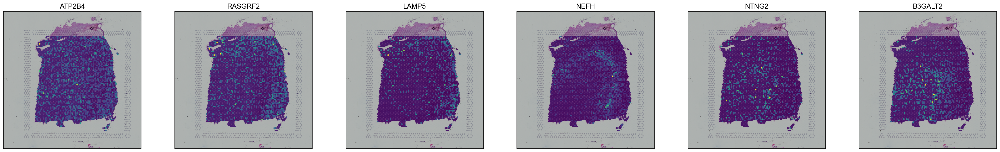

In [34]:
sq.pl.spatial_scatter(adata,color=["ATP2B4","RASGRF2","LAMP5","NEFH","NTNG2","B3GALT2"],
                      ncols=6,axis_label=["",""],size=1.5,colorbar =False,save="./151673_raw_marker.pdf")

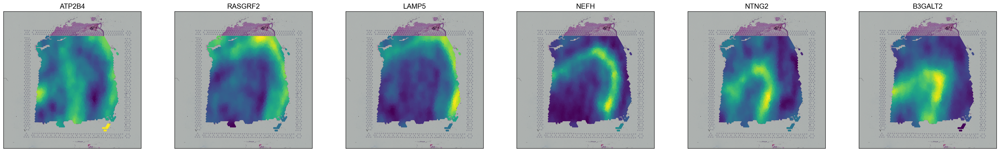

In [81]:
sq.pl.spatial_scatter(adata_new,color=["ATP2B4","RASGRF2","LAMP5","NEFH","NTNG2","B3GALT2"],
                      ncols=6,axis_label=["",""],size=2,colorbar =False,save="./151673_graphpca_marker_new_ZW.pdf")

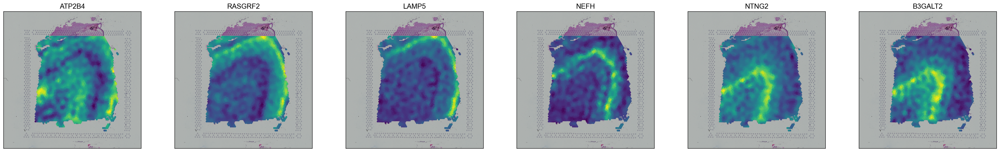

In [84]:
sq.pl.spatial_scatter(adata_spatialpca,color=["ATP2B4","RASGRF2","LAMP5","NEFH","NTNG2","B3GALT2"],
                      ncols=6,axis_label=["",""],size=2,colorbar =False,save="./151673_spatialpca_marker.pdf")

In [93]:
adata = adata[adata.obs.groundtruth!="NA",:]

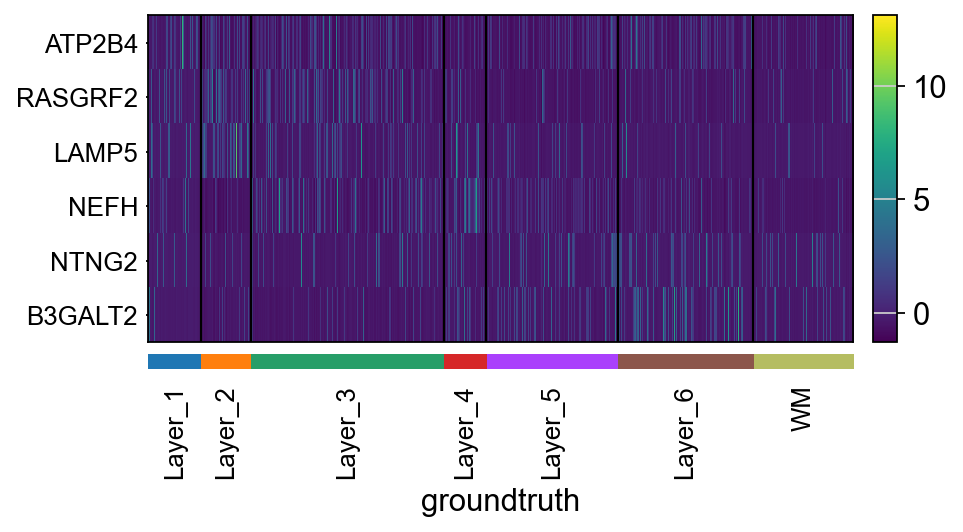

In [110]:
sc.pl.heatmap(adata, var_names=["ATP2B4","RASGRF2","LAMP5","NEFH","NTNG2","B3GALT2"], 
              groupby='groundtruth', cmap='viridis', dendrogram=False,swap_axes=True,
              figsize=(6,3),save="151673_raw_marker_heatmap.pdf")


In [91]:
adata_new = adata_new[adata_new.obs.groundtruth!="NA",:]

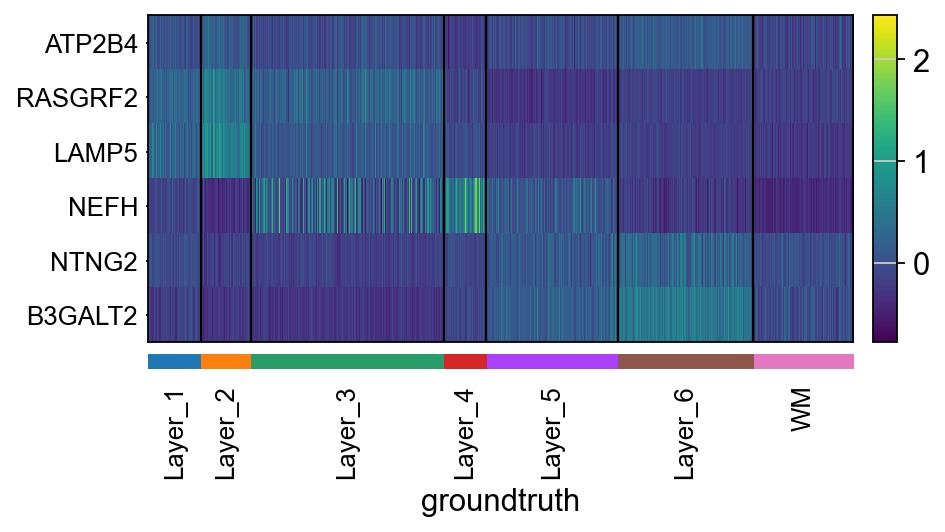

In [92]:
sc.pl.heatmap(adata_new, var_names=["ATP2B4","RASGRF2","LAMP5","NEFH","NTNG2","B3GALT2"], 
              groupby='groundtruth', cmap='viridis', dendrogram=False,swap_axes=True,
              figsize=(6,3),save="151673_graphpca_marker_heatmap_ZW.pdf")


In [103]:
adata_spatialpca = adata_spatialpca[adata_spatialpca.obs.groundtruth!="NA",:]

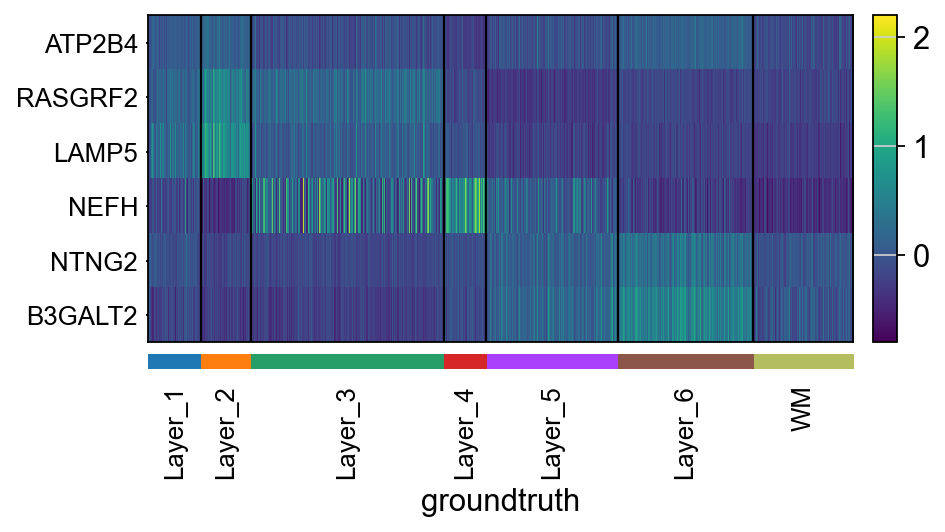

In [112]:
sc.pl.heatmap(adata_spatialpca, var_names=["ATP2B4","RASGRF2","LAMP5","NEFH","NTNG2","B3GALT2"], 
              groupby='groundtruth', cmap='viridis', dendrogram=False,swap_axes=True,
              figsize=(6,3),save="151673_spatialpca_marker_heatmap.pdf")


In [14]:
adata = sc.read("../../results/DLPFC/151673_GPCA.h5ad")

AnnData object with n_obs × n_vars = 3639 × 3000
    obs: 'in_tissue', 'array_row', 'array_col', 'groundtruth', 'GPCA_pred'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mean', 'std'
    uns: 'GPCA_pred_colors', 'groundtruth_colors', 'pearson_residuals_normalization', 'spatial'
    obsm: 'spatial'

## Check PC

In [17]:

def Run_GPCA(adata, location, n_components = 50, method = "knn", platform = "Visium", _lambda = 0.5, n_neighbors=6,
            save_reconstruction=False):
    Expr = adata.X
    if issparse(Expr):
        Expr = Expr.todense()
        
    if platform=="Visium":
        n_neighbors = 6
    elif platform=="ST":
        n_neighbors = 4
    if method=="knn":    
        graph = kneighbors_graph(np.asarray(location), int(n_neighbors), metric='euclidean',
                                             metric_params={}, include_self=False)
        graph = 0.5 * (graph + graph.T)
        graphL = csgraph.laplacian(graph,normed=False)
    
    G = scipy.sparse.eye(location.shape[0]) + _lambda * graphL
    if issparse(G):
        Ginv = np.array(np.linalg.inv(G.todense()))
    else:
        Ginv = np.array(np.linalg.inv(G))
    C = np.dot(np.dot(Expr.T,Ginv),Expr)
    lambdas,W = np.linalg.eigh(C)
    W = W[:, ::-1]
    W = W[:, :n_components]
    Z = np.dot(np.dot(Ginv,Expr),W)
    if save_reconstruction:
        adata.uns['GraphPCA_ReX'] = np.dot(Z,W.T)
    
    return Z,W

In [18]:
adata = sc.read("../../results/DLPFC/" + samples[sample_id] + "_GPCA.h5ad")

In [19]:
adata

AnnData object with n_obs × n_vars = 3639 × 3000
    obs: 'in_tissue', 'array_row', 'array_col', 'groundtruth', 'GPCA_pred'
    var: 'gene_ids', 'feature_types', 'genome', 'n_cells', 'mean', 'std'
    uns: 'GPCA_pred_colors', 'groundtruth_colors', 'pearson_residuals_normalization', 'spatial'
    obsm: 'spatial'

In [20]:
adata = sc.read(data_path + samples[sample_id] + "/sample_data.h5ad")
sc.pp.filter_genes(adata,min_cells=20)
sc.experimental.pp.normalize_pearson_residuals(adata)
sc.pp.scale(adata)
SVG_list = pd.read_csv("../../results/DLPFC/SpatialPCA_data_preprocess/" + samples[sample_id] + "_SVGs.csv",index_col=0)
adata = adata[:,adata.var.gene_ids.isin(SVG_list.x)]    

groundtruth=pd.read_csv(path_GT+samples[sample_id]+".csv", sep=",",header=0,na_filter=False,index_col=0) 
groundtruth=np.array(groundtruth["ground_truth"])
adata.obs["groundtruth"] = groundtruth


x_array=adata.obs["array_row"].tolist()
y_array=adata.obs["array_col"].tolist()
X=np.array([x_array, y_array]).T.astype(np.float32)

#Z,W = Run_GPCA(adata, location=X, n_components = 50, method = "knn", platform = "Visium", _lambda =0.5)

In [21]:

Z,W = Run_GPCA(adata, location=X, n_components = 50, method = "knn", platform = "Visium", _lambda =0.5,save_reconstruction=True)

In [22]:
GPCA_pcs = pd.DataFrame(Z)
GPCA_pcs.index = adata.to_df().index
GPCA_pcs.columns = [ "PC_" + str(i) for i in np.arange(GPCA_pcs.shape[1]) ]


In [24]:
adata.obs = pd.concat([adata.obs,GPCA_pcs],axis=1)

In [27]:
sc.set_figure_params( color_map = 'viridis',figsize=(5,5))

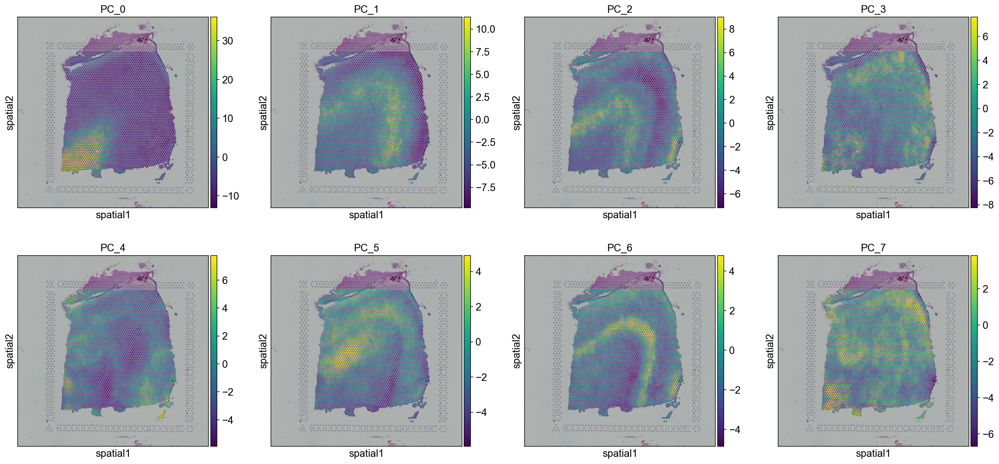

In [29]:
sq.pl.spatial_scatter(adata,color=["PC_0","PC_1","PC_2","PC_3","PC_4","PC_5","PC_6","PC_7"])

In [34]:
GPCA_w = pd.DataFrame(W)
GPCA_w.index = adata.to_df().columns
GPCA_w.columns = [ "PC_" + str(i) for i in np.arange(GPCA_w.shape[1]) ]


In [38]:
top_5_rows = {}
for column in GPCA_w.columns:
    top_5_rows[column] = GPCA_w.nlargest(5, column).index.tolist()

In [39]:
top_5_rows

{'PC_0': ['MBP', 'PLP1', 'CRYAB', 'CNP', 'GFAP'],
 'PC_1': ['TMSB10', 'TUBA1B', 'STMN1', 'SNAP25', 'TUBB2A'],
 'PC_2': ['GPM6A', 'DIRAS2', 'SCN3B', 'KRT17', 'ATP2B1'],
 'PC_3': ['ENC1', 'HOPX', 'CAMK2N1', 'NECAB1', 'APLP1'],
 'PC_4': ['SCGB2A2', 'KRT19', 'MUC1', 'TFF1', 'KRT8'],
 'PC_5': ['COX6C', 'KRT19', 'MT-ATP6', 'H2AFJ', 'IFI27'],
 'PC_6': ['PCP4', 'PCP4L1', 'HPCA', 'FRMPD2', 'CXCL14'],
 'PC_7': ['COX6C', 'KRT19', 'IFI27', 'RPL41', 'KRT8'],
 'PC_8': ['COX6C', 'MYL9', 'MT1G', 'TAGLN', 'H2AFJ'],
 'PC_9': ['MUC1', 'SCGB2A2', 'TMSB10', 'TFF1', 'PCP4'],
 'PC_10': ['IGKC', 'ACTB', 'IGHG4', 'IGLC2', 'AC005944.1'],
 'PC_11': ['ATP1B1', 'SCGB2A2', 'NME7', 'LRRC75A', 'SCGB1D2'],
 'PC_12': ['MALAT1', 'SAA1', 'MYL9', 'FABP4', 'TAGLN'],
 'PC_13': ['IGHA1', 'CXCL14', 'IGKC', 'SAA1', 'SLC1A2'],
 'PC_14': ['MGP', 'RTN4', 'C9orf16', 'VAT1L', 'CTXN1'],
 'PC_15': ['SAA1', 'FABP4', 'MGP', 'ADIRF', 'LRRC75A'],
 'PC_16': ['SAA1', 'FABP4', 'COL1A2', 'SLC6A1', 'GAD1'],
 'PC_17': ['MGP', 'FRMPD2', 'OLFM1'

In [48]:
adata.layers["GraphPCA_ReX"] = adata.uns["GraphPCA_ReX"]

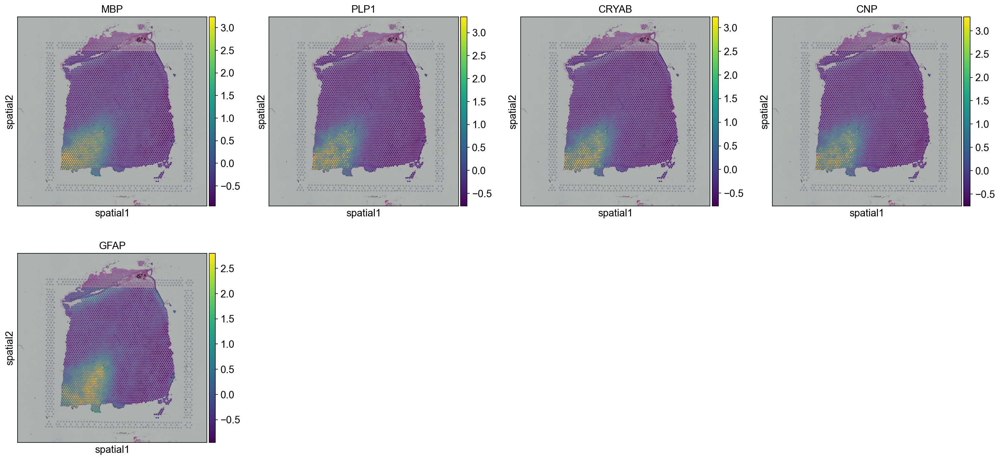

In [50]:
sq.pl.spatial_scatter(adata,color=top_5_rows["PC_0"],layer="GraphPCA_ReX")